This analysis is based on the videos generated in the following folder: /Volumes/L_MillerLab/data/Pop_18E3/Videos/20220203/data-UChicago/Modified_Videos/jarvis_testing_modified_compressed_30crf_presetfaster

- Step 1: Run modified videos through jarvis and obtain position data
- Step 2: Interpolate position data where dropped/duplicated frames occur
- Step 3: Get joint angles based on interpolated data
- Step 4a: Do PCA on joint angles; plot PCA over time
- Step 4b: Get joint speeds based based on joint angles (will mostly be noise, consider filtering? Butterworth filter)
- Step 5: Correlate angle data to 

In [1]:
# This is used to import matlab_jarvis_files, which exists in the above directory
import sys
sys.path.append('../')

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matlab_jarvis_files import get_jarvis_errors
from matlab_jarvis_files import scatter_jarvis_errors
import scipy
from scipy import stats
from scipy import signal
from matlab_jarvis_files import plot_linklengths as pl
import joint_angles as ja
from sklearn.decomposition import PCA

# Get Jarvis Predictions from Modified Frame-Inserted Videos

In [3]:
data_path = '/Volumes/L_MillerLab/limblab/User_folders/Aajan/Jarvis_results/Aajan-MonkeyHand-PretrainedWeights-20220512/Pop/1108_Predictions_3D_20220711-144019/data3D.csv'
data = np.genfromtxt(data_path, delimiter=',')
data.shape

(18392, 69)

# Linear Interpolation for Position Data

In [11]:
#subtract 1 from all indeces because matlab starts at 1, python starts at 0
cam_dupe_indeces_0 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Duplicated_Frames/cam_0_duplicate_frames.txt')
cam_dupe_indeces_0 = (cam_dupe_indeces_0-1).astype(int)
cam_dupe_indeces_1 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Duplicated_Frames/cam_1_duplicate_frames.txt')
cam_dupe_indeces_1 = (cam_dupe_indeces_1-1).astype(int)
cam_dupe_indeces_2 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Duplicated_Frames/cam_2_duplicate_frames.txt')
cam_dupe_indeces_2 = (cam_dupe_indeces_2-1).astype(int)
cam_dupe_indeces_3 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Duplicated_Frames/cam_3_duplicate_frames.txt')
cam_dupe_indeces_3 = (cam_dupe_indeces_3-1).astype(int)

logfile_0 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Old_Logfiles/cam_0_logfile.txt')
logfile_1 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Old_Logfiles/cam_1_logfile.txt')
logfile_2 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Old_Logfiles/cam_2_logfile.txt')
logfile_3 = np.genfromtxt('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20211108/data/Old_Logfiles/cam_3_logfile.txt')

In [12]:
cam_dupe_indeces_0.shape, cam_dupe_indeces_1.shape, cam_dupe_indeces_2.shape, cam_dupe_indeces_3.shape

((390,), (390,), (389,), (390,))

### Create Dictionary with number of cameras dropped per frame

In [13]:
cam_dupe_indeces = [cam_dupe_indeces_0,cam_dupe_indeces_1,cam_dupe_indeces_2,cam_dupe_indeces_3]

d = {}

for cam_dupes in cam_dupe_indeces:
    for ind in cam_dupes:
        if ind not in d:
            d[ind] = 1
        else:
            d[ind]+=1
d = dict(sorted(d.items()))

In [8]:
len(d)

1900

In [9]:
d

{0: 4,
 175: 4,
 177: 4,
 179: 3,
 180: 1,
 350: 4,
 352: 4,
 354: 4,
 356: 4,
 452: 4,
 512: 1,
 513: 3,
 521: 2,
 522: 2,
 539: 4,
 605: 4,
 649: 4,
 656: 1,
 657: 3,
 701: 2,
 702: 2,
 758: 2,
 759: 2,
 1064: 2,
 1065: 2,
 1070: 4,
 1072: 4,
 1142: 1,
 1143: 3,
 1427: 4,
 1429: 4,
 1431: 4,
 1541: 4,
 1573: 4,
 1666: 3,
 1667: 1,
 1711: 1,
 1712: 3,
 1760: 4,
 1781: 4,
 1783: 4,
 1785: 4,
 1787: 4,
 1953: 4,
 2063: 4,
 2065: 4,
 2090: 2,
 2091: 2,
 2273: 1,
 2274: 3,
 2276: 4,
 2285: 1,
 2286: 3,
 2416: 4,
 2477: 4,
 2479: 4,
 2747: 4,
 2999: 4,
 3057: 4,
 3124: 3,
 3125: 1,
 3131: 4,
 3257: 1,
 3258: 3,
 3260: 1,
 3261: 3,
 3302: 4,
 3304: 4,
 3306: 4,
 3317: 4,
 3356: 2,
 3357: 2,
 3383: 4,
 3407: 4,
 3409: 4,
 3434: 4,
 3436: 4,
 3438: 4,
 3445: 4,
 3482: 4,
 3497: 4,
 3797: 4,
 3799: 4,
 3824: 4,
 3950: 3,
 3951: 1,
 3957: 4,
 4103: 4,
 4105: 4,
 4130: 4,
 4166: 4,
 4321: 4,
 4465: 4,
 4579: 3,
 4580: 1,
 4642: 3,
 4643: 1,
 4673: 4,
 4727: 2,
 4728: 2,
 4867: 4,
 4869: 4,
 4874

In [16]:
logfile_list = [logfile_0, logfile_1, logfile_2, logfile_3]
diff_matx = []
for logfile in logfile_list:
    diff_list = []
    for x, y in zip(logfile[0:], logfile[1:]):
        diff_list.append(y-x)
    diff_list.append(0.033)
    diff_matx.append(diff_list)

diff_matx = np.array(diff_matx)

In [17]:
diff_matx.shape

(4, 18000)

In [23]:
num_frames_dropped = (np.round(np.array(diff_matx)/0.033)-1).T

In [24]:
num_frames_dropped.shape

(18000, 4)

In [25]:
num_frames_dropped

array([[0., 0., 0., 1.],
       [1., 1., 1., 0.],
       [0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]])

In [50]:
total_frames_dropped = np.sum(num_frames_dropped, axis = 1)
total_frames_dropped

array([1., 3., 0., ..., 0., 0., 0.])

In [54]:
len(total_frames_dropped[total_frames_dropped > 0])

647

In [33]:
num_cams_dropped = np.sum((num_frames_dropped>0).astype(int), axis = 1)
num_cams_dropped

array([1, 3, 0, ..., 0, 0, 0])

In [ ]:
dropped_frames = num_frames_dropped[np.where(num_frames_dropped>0)]

### Linear Interpolation only where adjacent frames have no drops

In [14]:
for ind in d:
    if (((ind+1) in d) or ((ind-1) in d)):
        continue
    else:
        data[ind] = (data[ind-1]+data[ind+1])/2
        
#     if ((d[ind] == 4) or (d[ind] == 3)):
#         data[ind] = (data[ind-1]+data[ind+1])/2
#     elif ((d[ind] == 2) and ((ind+1) in d)):
#         if d[ind+1]==2:
#             continue
#         else:
#             data[ind] = (data[ind-1]+data[ind+1])/2
#     elif (d[ind] == 2):
#         data[ind] = (data[ind-1]+data[ind+1])/2

In [15]:
import csv
with open("/Volumes/L_MillerLab/limblab/User_folders/Aajan/Jarvis_results/Aajan-MonkeyHand-PretrainedWeights-20220512/Pop/1108_Predictions_3D_20220711-144019/data3D_linear_interpolation.csv", "w") as f:
    writer = csv.writer(f)
    writer.writerows(data)

# Use Linearly Interpolated Data to Generate Joint Angles

In [70]:
angles = ja.get_joint_angles('/Volumes/L_MillerLab/limblab/User_folders/Aajan/Jarvis_results/Aajan-MonkeyHand-PretrainedWeights-20220512/Pop/1108_Predictions_3D_20220711-144019/data3D_linear_interpolation.csv')

Shape: num time points, num fingers, num joints

angles[0,0,:] gets all the joints for a single finger (in this case pinky) at one time point

angles[0,:,0] gets a single joint type (in this case DIP) for all fingers at one time point

In [71]:
angles.shape

(18392, 5, 3)

In [72]:
non_nan_frames = []
for i in range(len(angles)):
    if (~np.isnan(angles)[i]).all():
        non_nan_frames.append(i)
    if (np.isnan(angles)[i]).all():
        print(i)

0
1532
1537
1539
3403
4195
4673
4674
4675
4676
4677
4678
4679
4680
4681
4682
4683
4684
4685
4686
4687
4688
4689
4690
4691
4692
4693
4694
4695
4696
4697
4698
4699
4700
4701
4702
4703
4704
4705
4706
4707
4759
4763
4764
4765
4766
4767
4768
4769
4770
4771
4772
4773
4774
4775
4776
4777
4778
4779
4780
4782
4783
4784
4785
4787
4788
4968
4969
4970
4974
4976
4977
4992
4993
4994
4995
4996
4997
5000
5216
5231
5232
5233
5235
5236
5237
5489
5491
6503
6504
8245
8389
8390
8936
8937
8938
8939
8940
8941
8969
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8984
8985
8986
8988
8990
8992
9249
9250
9251
9252
9253
9254
9255
9256
9257
9258
9259
9260
9261
9263
9265
9266
9267
9268
9269
9281
9282
9289
10723
10724
10743
10746
10747
10748
10749
10750
10751
10753
10754
10755
10756
10757
10758
10759
10760
10761
10762
10763
10764
10965
10976
10977
10978
10979
10980
10981
10982
10983
10984
10987
10988
10989
10990
10991
10992
10993
10994
10995
10996
10997
10998
10999
11000
11001
11002
11003
11004
11005
11006
11007
1

In [73]:
angles = angles[non_nan_frames,:,:]

In [74]:
angles.shape

(17795, 5, 3)

In [75]:
angles_reshaped = np.reshape(angles, (-1,15))

In [76]:
angles_reshaped.shape

(17795, 15)

#### Save angle data to matlab file for comparison with video data in Bento

In [23]:
!pwd

/Users/aajanquail/Desktop/Jupyter_Notebooks/Miller_Lab/Frame_Dropping


In [16]:
from scipy import io as scio
scio.savemat('/Volumes/L_MillerLab/data/Pop_18E3/Videos/20210712/Data/angles_data.mat', {'angle_data': angles_reshaped})

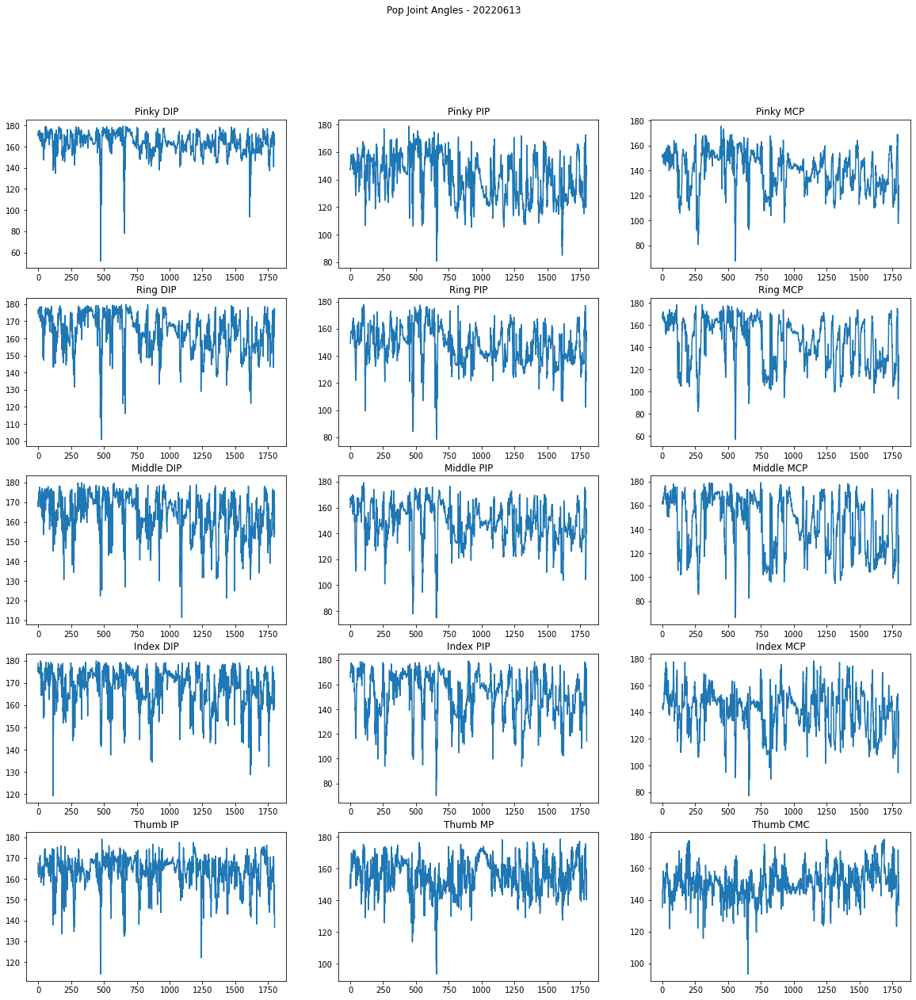

In [10]:
ja.plot_angles_timeplot(angles, '20220613', [720,2520])

# PCA Plots

In [69]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_features = pca.fit_transform(angles_reshaped)

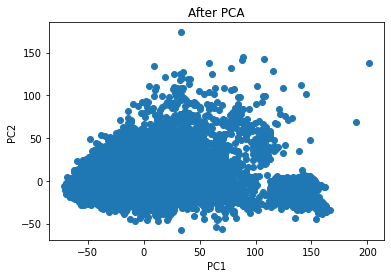

In [70]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(pca_features[:,0], pca_features[:,1])
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('After PCA')
plt.show()

In [71]:
angles_no_thumb = angles[:,:4,:]

In [72]:
angles_no_thumb.shape

(18547, 4, 3)

In [73]:
angles_no_thumb_reshaped = np.reshape(angles_no_thumb, (-1,12))

In [74]:
from sklearn.decomposition import PCA
pca_no_thumb = PCA(n_components=2)
pca_features_no_thumb = pca_no_thumb.fit_transform(angles_no_thumb_reshaped)

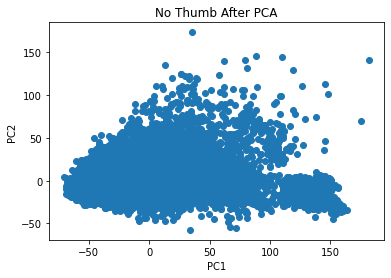

In [75]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(pca_features_no_thumb[:,0], pca_features_no_thumb[:,1])
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('No Thumb After PCA')
plt.show()

In [76]:
angles_no_thumb_no_prox = angles[:,:4,:2]

In [77]:
angles_no_thumb_no_prox.shape

(18547, 4, 2)

In [78]:
angles_no_thumb_no_prox_reshaped = np.reshape(angles_no_thumb_no_prox, (-1,8))

In [79]:
pca_no_thumb_no_prox = PCA(n_components=2)
pca_features_no_thumb_no_prox = pca_no_thumb.fit_transform(angles_no_thumb_no_prox_reshaped)

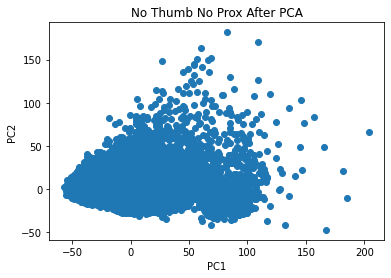

In [80]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(pca_features_no_thumb_no_prox[:,0], pca_features_no_thumb_no_prox[:,1])
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('No Thumb No Prox After PCA')
plt.show()

# PCA Analysis - Plot vs Neural Data

## Import Neural Data

In [24]:
import scipy.io
neural_data = scipy.io.loadmat('/Volumes/L_MillerLab/data/Pop_18E3/CerebusData/20211108/20211108_units_smoothed.mat')

In [25]:
type(neural_data), neural_data

(dict,
 {'__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Mon Jul 11 16:02:59 2022',
  '__version__': '1.0',
  '__globals__': [],
  'units_smoothed': array([[0.36165238, 0.57932371, 0.8717786 , ..., 1.10513108, 0.92849115,
          0.75631772],
         [0.20567227, 0.26564764, 0.32897108, ..., 0.54331075, 0.53660911,
          0.56613149],
         [0.15598012, 0.2430328 , 0.39650318, ..., 0.1353265 , 0.08377157,
          0.04521799],
         ...,
         [0.        , 0.        , 0.        , ..., 0.34202843, 0.48574935,
          0.62897659],
         [0.45723622, 0.58070585, 0.66046751, ..., 0.71027363, 0.94117883,
          1.16574782],
         [0.04589169, 0.0847322 , 0.13666625, ..., 0.20776156, 0.11869276,
          0.05989812]])})

In [78]:
non_nan_frames_neural = [i for i in non_nan_frames if i<=18000]

In [27]:
neural_data['units_smoothed'].shape

(93, 18001)

In [80]:
neural_data['units_smoothed'] = neural_data['units_smoothed'][:,non_nan_frames_neural]

In [81]:
neural_data['units_smoothed'].shape

(93, 17513)

In [82]:
pca_neural = PCA(n_components=1)
pca_neural_features = pca_neural.fit_transform(neural_data['units_smoothed'].T)

In [83]:
pca_neural_features.shape

(17513, 1)

## PCA Analysis - MCP Joints

In [84]:
num_timepoints = angles_reshaped.shape[0]

In [85]:
angles.shape

(17795, 5, 3)

In [86]:
angles_reshaped.shape

(17795, 15)

In [87]:
# get all mcp joints, but exclude thumb
mcp_joints = angles[:,:4,2]
mcp_joints = np.reshape(mcp_joints,(num_timepoints,-1))

In [88]:
mcp_joints.shape

(17795, 4)

In [89]:
pca_mcp = PCA(n_components=1)
pca_mcp_features = pca_mcp.fit_transform(mcp_joints)

In [90]:
pca_mcp_features.shape

(17795, 1)

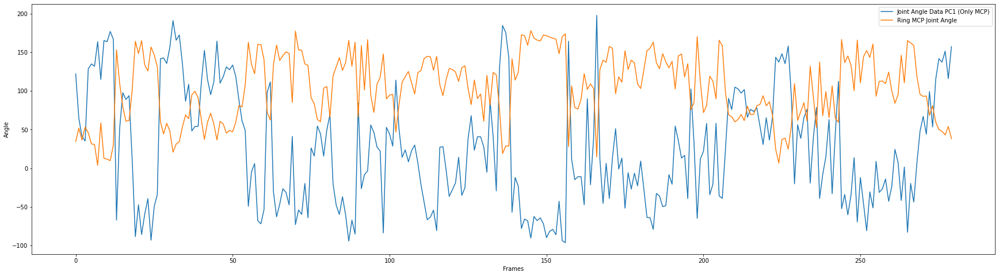

In [91]:
plt.figure(figsize=(30,8))
plt.plot(pca_mcp_features[720:1000])
plt.plot(mcp_joints[:,1][720:1000])
plt.xlabel('Frames')
plt.ylabel('Angle')
plt.legend(['Joint Angle Data PC1 (Only MCP)','Ring MCP Joint Angle'])
plt.show()

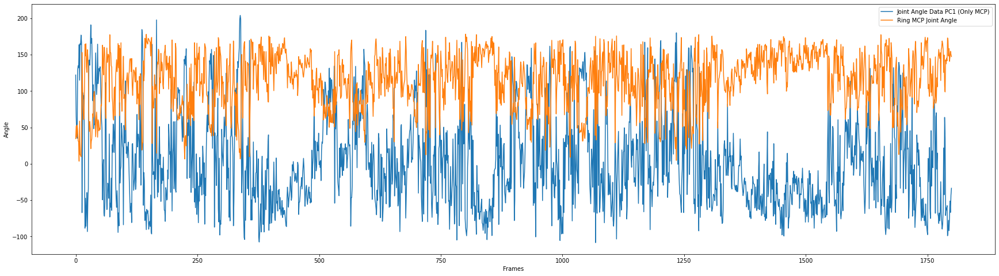

In [92]:
plt.figure(figsize=(30,8))
plt.plot(pca_mcp_features[720:2520])
plt.plot(mcp_joints[:,1][720:2520])
plt.xlabel('Frames')
plt.ylabel('Angle')
plt.legend(['Joint Angle Data PC1 (Only MCP)','Ring MCP Joint Angle'])
plt.show()

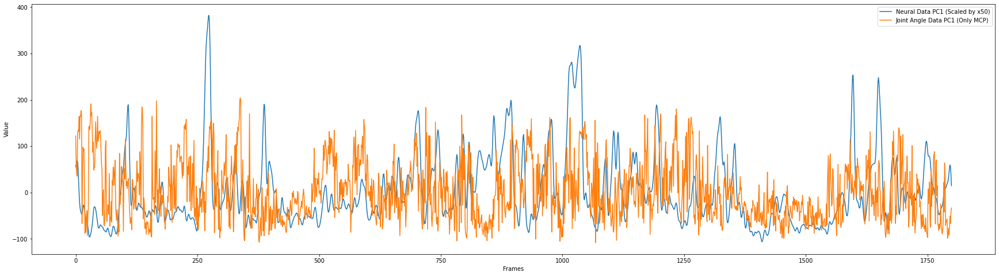

In [93]:
plt.figure(figsize=(30,8))
plt.plot(pca_neural_features[720:2520]*50)
plt.plot(pca_mcp_features[720:2520])
plt.legend(['Neural Data PC1 (Scaled by x50)', 'Joint Angle Data PC1 (Only MCP)'])
plt.xlabel('Frames')
plt.ylabel('Value')
plt.show()

## PCA Analysis - PIP Joints

In [94]:
# get all mcp joints, but exclude thumb
pip_joints = angles[:,:4,1]
pip_joints = np.reshape(pip_joints,(num_timepoints,-1))

In [95]:
pca_pip = PCA(n_components=1)
pca_pip_features = pca_pip.fit_transform(pip_joints)

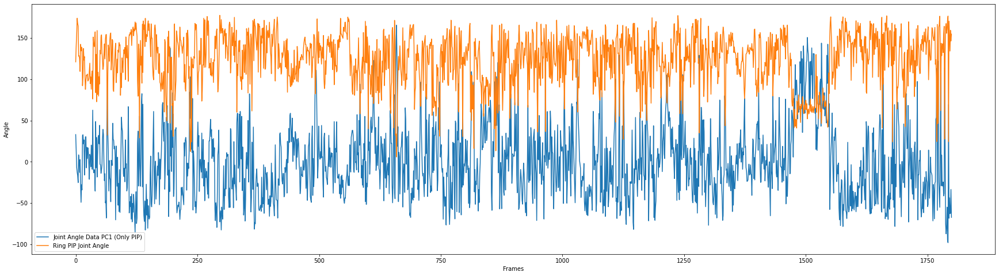

In [96]:
plt.figure(figsize=(30,8))
plt.plot(pca_pip_features[720:2520])
plt.plot(pip_joints[:,1][720:2520])
plt.xlabel('Frames')
plt.ylabel('Angle')
plt.legend(['Joint Angle Data PC1 (Only PIP)','Ring PIP Joint Angle'])
plt.show()

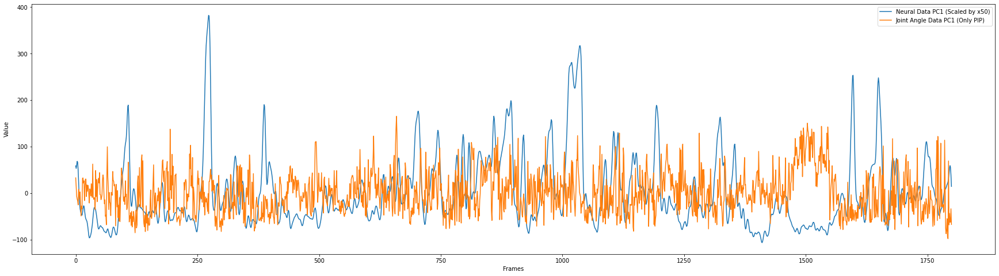

In [97]:
plt.figure(figsize=(30,8))
plt.plot(pca_neural_features[720:2520]*50)
plt.plot(pca_pip_features[720:2520])
plt.legend(['Neural Data PC1 (Scaled by x50)', 'Joint Angle Data PC1 (Only PIP)'])
plt.xlabel('Frames')
plt.ylabel('Value')
plt.show()

## PCA Analysis - DIP Joints

In [98]:
# get all mcp joints, but exclude thumb
dip_joints = angles[:,:4,0]
dip_joints = np.reshape(dip_joints,(num_timepoints,-1))

In [99]:
pca_dip = PCA(n_components=1)
pca_dip_features = pca_dip.fit_transform(dip_joints)

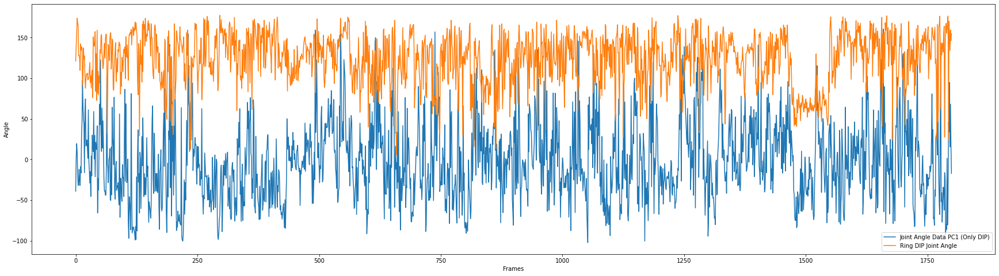

In [100]:
plt.figure(figsize=(30,8))
plt.plot(pca_dip_features[720:2520])
plt.plot(pip_joints[:,1][720:2520])
plt.xlabel('Frames')
plt.ylabel('Angle')
plt.legend(['Joint Angle Data PC1 (Only DIP)','Ring DIP Joint Angle'])
plt.show()

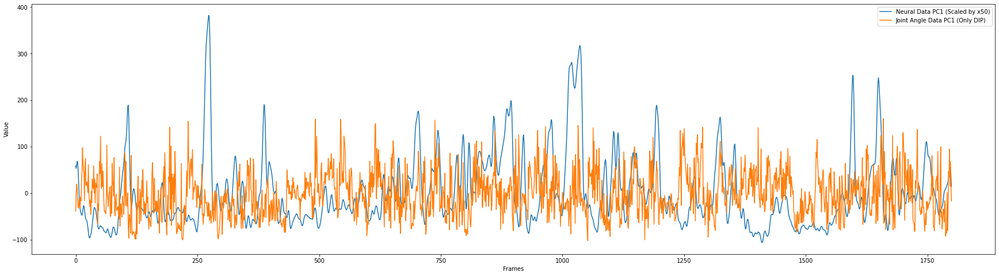

In [101]:
plt.figure(figsize=(30,8))
plt.plot(pca_neural_features[720:2520]*50)
plt.plot(pca_dip_features[720:2520])
plt.legend(['Neural Data PC1 (Scaled by x50)', 'Joint Angle Data PC1 (Only DIP)'])
plt.xlabel('Frames')
plt.ylabel('Value')
plt.show()

## PCA Analysis - Hinge Joints

In [102]:
# get all mcp joints, but exclude thumb
hinge_joints = angles[:,:4,:2]
hinge_joints = np.reshape(hinge_joints,(num_timepoints,-1))

In [103]:
hinge_joints.shape

(17795, 8)

In [104]:
pca_hinge = PCA(n_components=1)
pca_hinge_features = pca_dip.fit_transform(hinge_joints)

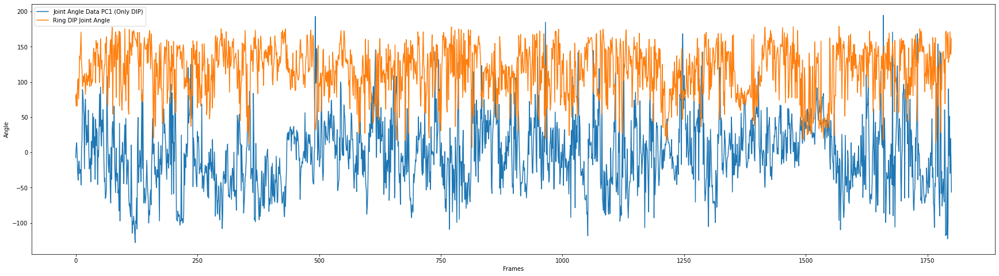

In [105]:
plt.figure(figsize=(30,8))
plt.plot(pca_hinge_features[720:2520])
plt.plot(hinge_joints[:,1][720:2520])
plt.xlabel('Frames')
plt.ylabel('Angle')
plt.legend(['Joint Angle Data PC1 (Only DIP)','Ring DIP Joint Angle'])
plt.show()

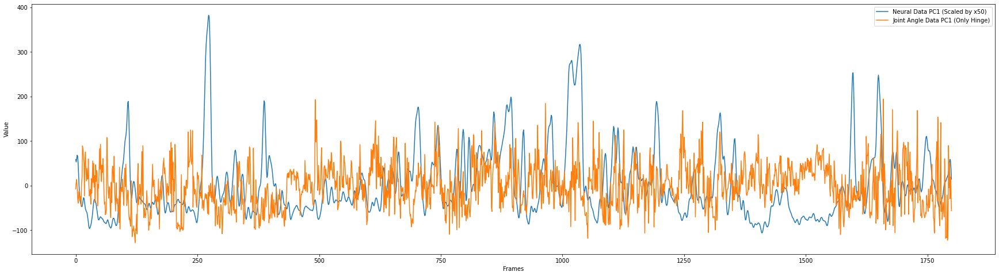

In [106]:
plt.figure(figsize=(30,8))
plt.plot(pca_neural_features[720:2520]*50)
plt.plot(pca_hinge_features[720:2520])
plt.legend(['Neural Data PC1 (Scaled by x50)', 'Joint Angle Data PC1 (Only Hinge)'])
plt.xlabel('Frames')
plt.ylabel('Value')
plt.show()

Save numpy arrays to csv

In [107]:
pca_neural_features.shape, pca_mcp_features.shape

((17513, 1), (17795, 1))

In [109]:
array_to_save = np.c_[pca_neural_features[720:2520], pca_mcp_features[720:2520], pca_pip_features[720:2520], pca_dip_features[720:2520], pca_hinge_features[720:2520]]
np.savetxt('/Users/aajanquail/Downloads/20211108_pca_arrays.txt', array_to_save, delimiter=',') 

## Filtering - Butterworth

In [44]:
mcp_joints[:,0].shape

(18548,)

In [45]:
# apply a 3-pole lowpass filter at 0.1x Nyquist frequency
import scipy
b, a = scipy.signal.butter(4, 0.33)
filtered = scipy.signal.filtfilt(b, a, mcp_joints[:,0])

In [60]:
bottom_limit = 720
upper_limit = 1020
xaxis_seconds = np.arange(bottom_limit,upper_limit)/30

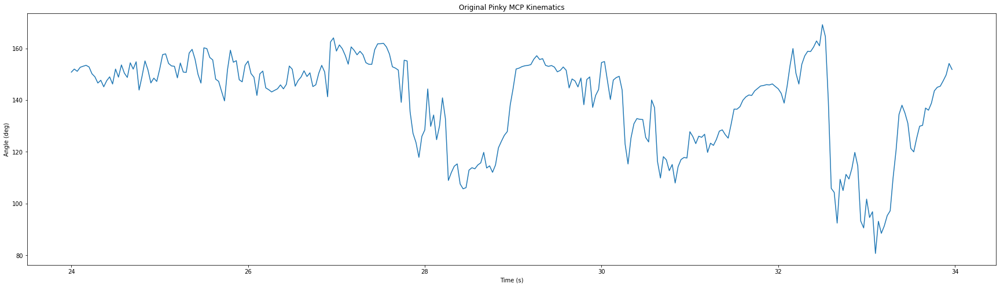

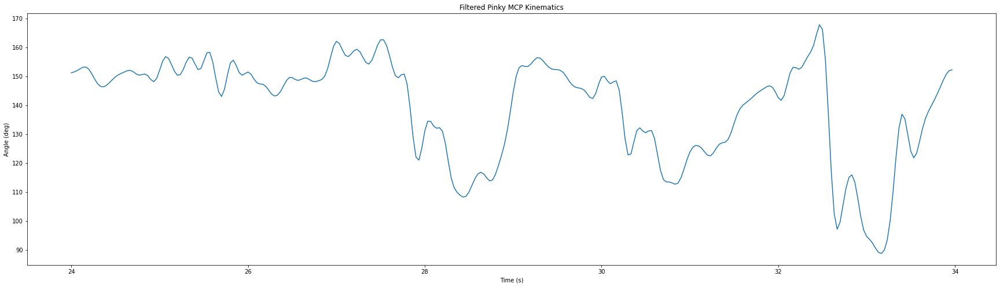

In [61]:
plt.figure(figsize=(30,8))
plt.plot(xaxis_seconds, mcp_joints[bottom_limit:upper_limit,0])
plt.title('Original Pinky MCP Kinematics')
plt.xlabel('Time (s)')
plt.ylabel('Angle (deg)')
plt.show()

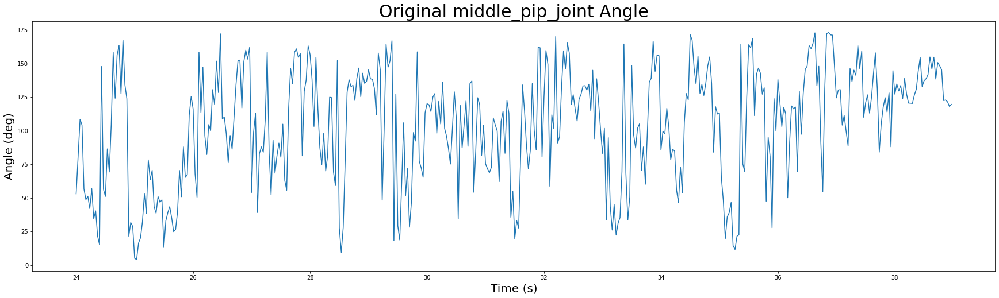

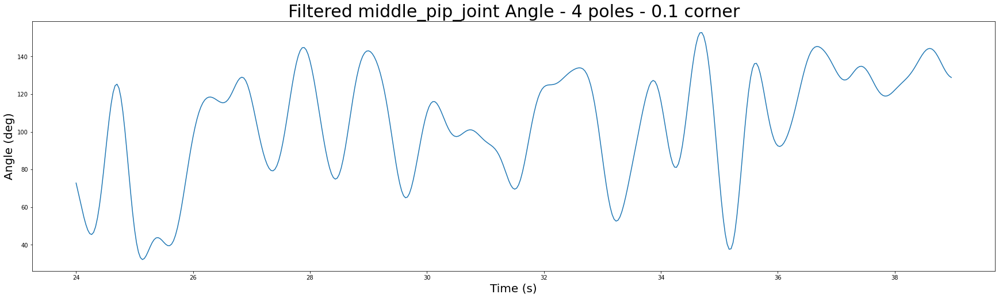

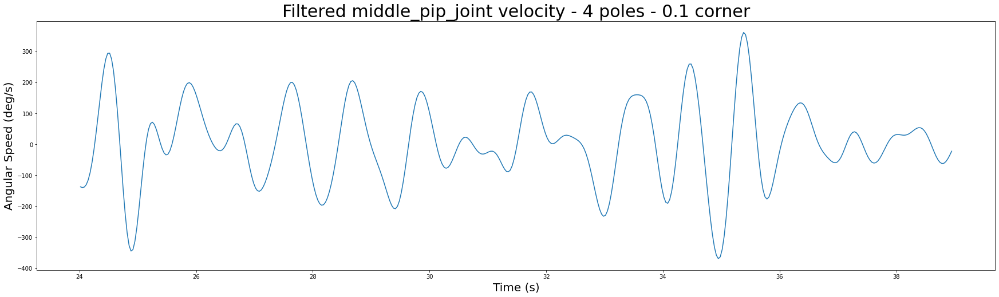

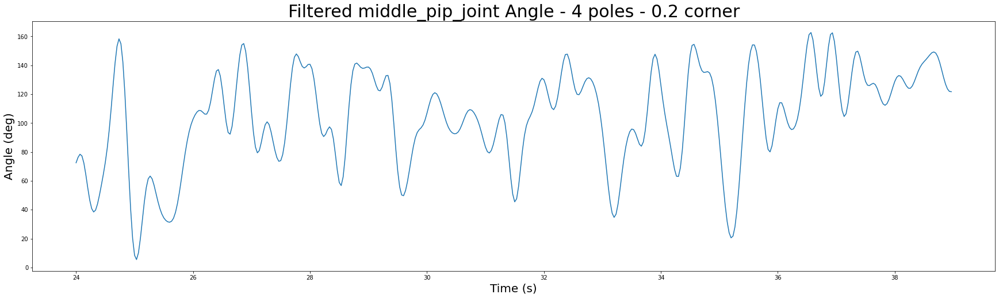

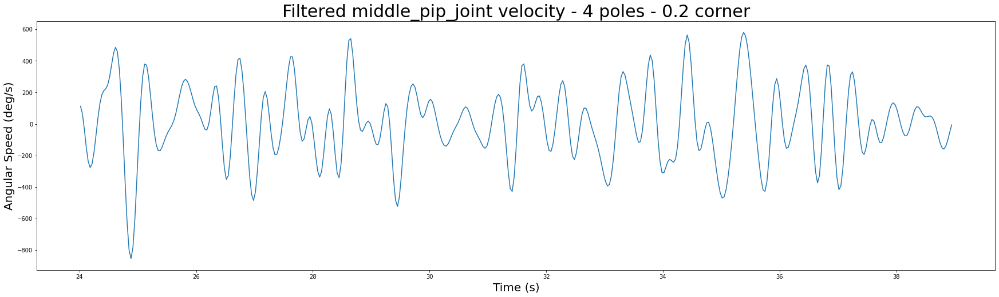

...

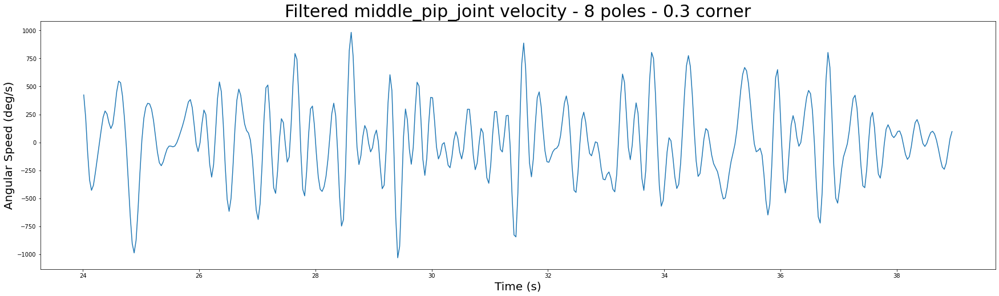

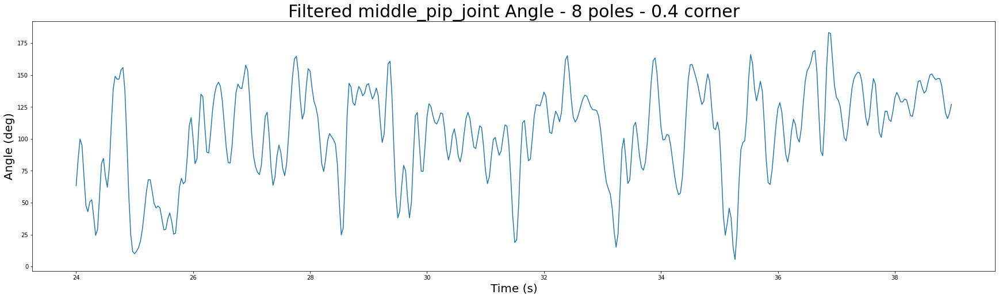

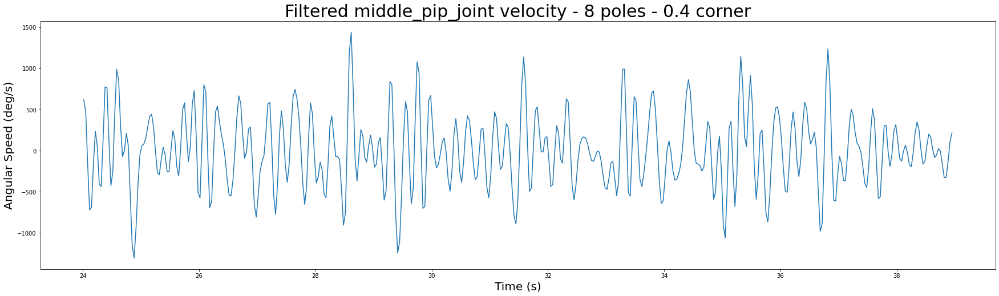

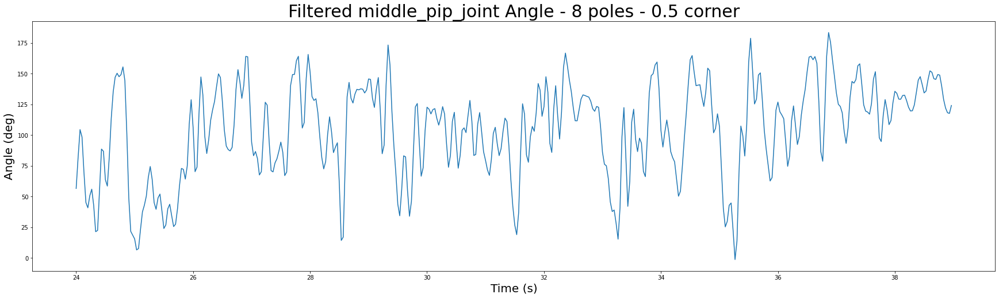

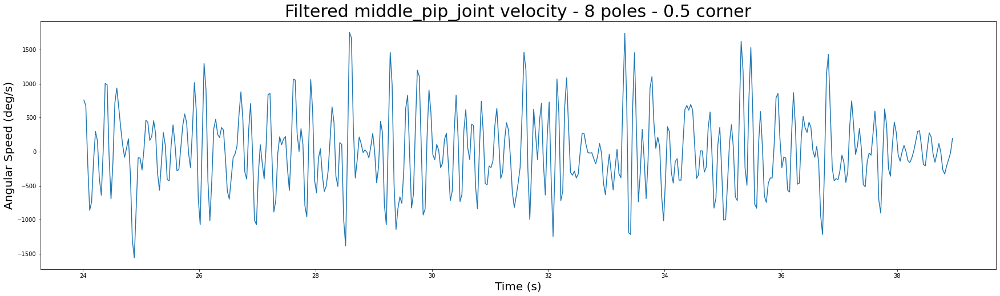

In [115]:
bottom_limit = 720
upper_limit = 1170
xaxis_seconds = np.arange(bottom_limit,upper_limit)/30
middle_pip_joint = angles[:,3,2]
# pca_mcp_features = pca_mcp_features.flatten()

orders = [4,5,6,7,8]
corners = [0.1,0.2,0.3,0.4,0.5]

plt.figure(figsize=(30,8))
plt.plot(xaxis_seconds, middle_pip_joint[bottom_limit:upper_limit])
plt.title('Original middle_pip_joint Angle', fontsize = 30)
plt.xlabel('Time (s)', fontsize = 20)
plt.ylabel('Angle (deg)', fontsize = 20)
plt.show()

for order in orders:
    for corner in corners:
        b, a = scipy.signal.butter(order, corner)
        filtered = scipy.signal.filtfilt(b, a, middle_pip_joint)
        
        plt.figure(figsize=(30,8))
        plt.plot(xaxis_seconds, filtered[bottom_limit:upper_limit])
        tit = 'Filtered middle_pip_joint Angle - ' +str(order)+ ' poles - ' +str(corner)+ ' corner'
        plt.title(tit, fontsize = 30)
        plt.xlabel('Time (s)', fontsize = 20)
        plt.ylabel('Angle (deg)', fontsize = 20)
        plt.show()
        
        der = np.diff(filtered[bottom_limit:upper_limit]) / np.diff(xaxis_seconds)
        x2 = (xaxis_seconds[:-1] + xaxis_seconds[1:]) / 2
        plt.figure(figsize=(30,8))
        plt.plot(x2, der)
        tit = 'Filtered middle_pip_joint velocity - ' +str(order)+ ' poles - ' +str(corner)+ ' corner'
        plt.title(tit, fontsize = 30)
        plt.xlabel('Time (s)', fontsize = 20)
        plt.ylabel('Angular Speed (deg/s)', fontsize = 20)
        plt.show()
        if ((order == 4) and (corner == 0.3)):
            np.savetxt('/Users/aajanquail/Downloads/1108_middle_pip_joint_velocity_butterworth_4poles_03corner.txt', der, delimiter=',')
            np.savetxt('/Users/aajanquail/Downloads/1108_middle_pip_joint_angle_butterworth_4poles_03corner.txt', filtered[bottom_limit:upper_limit], delimiter=',')

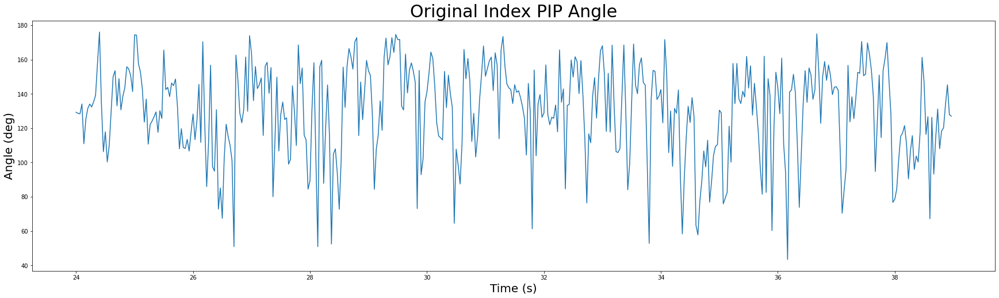

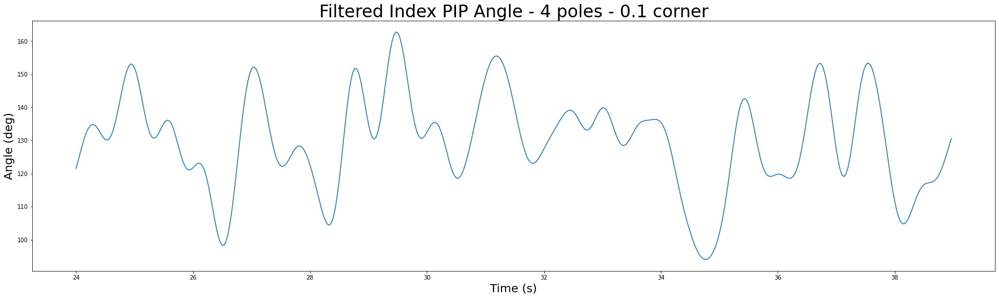

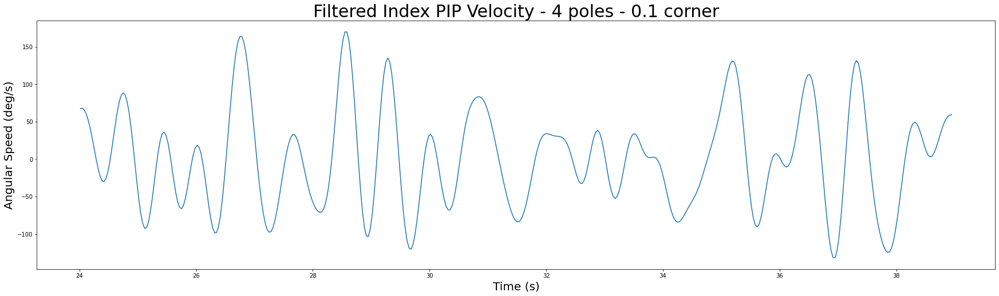

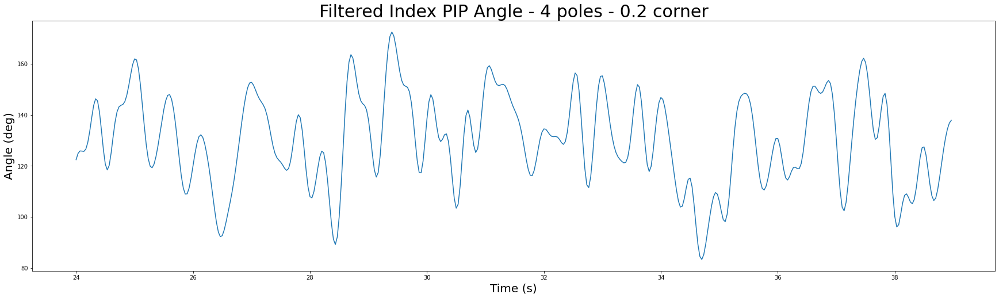

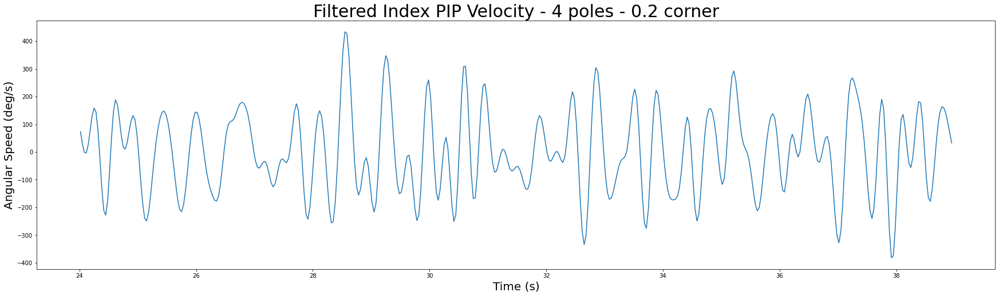

...

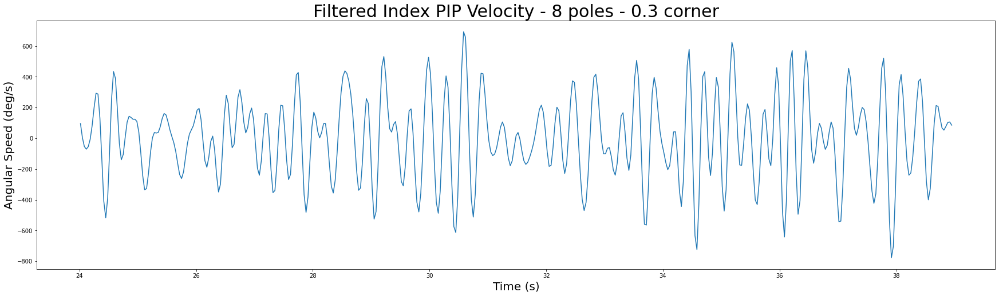

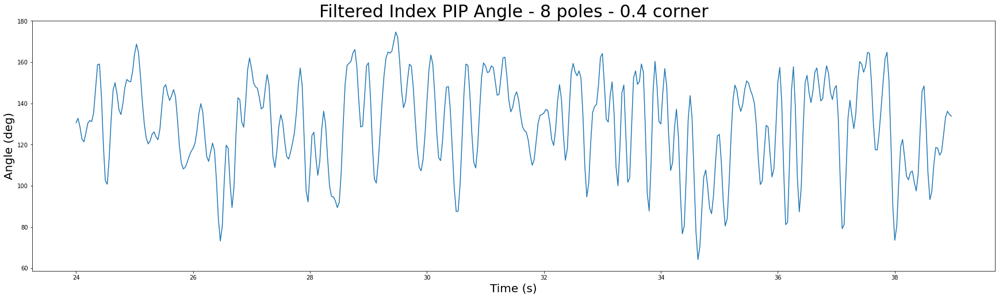

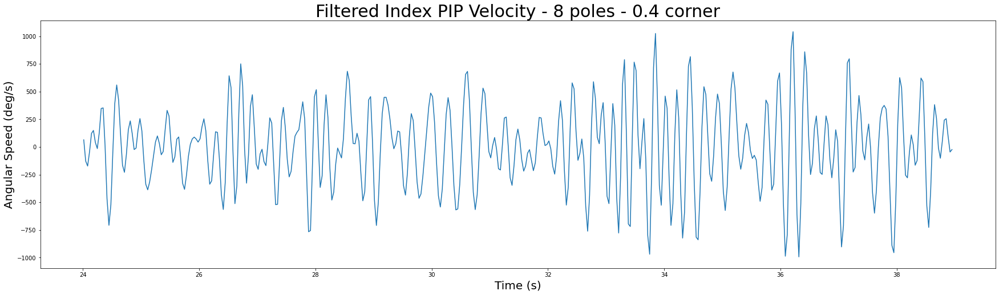

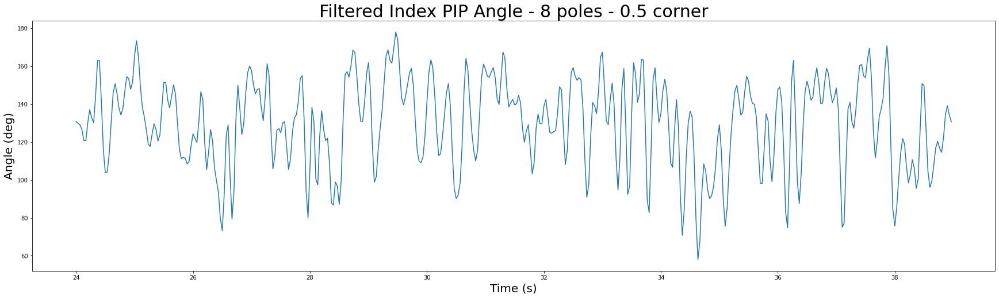

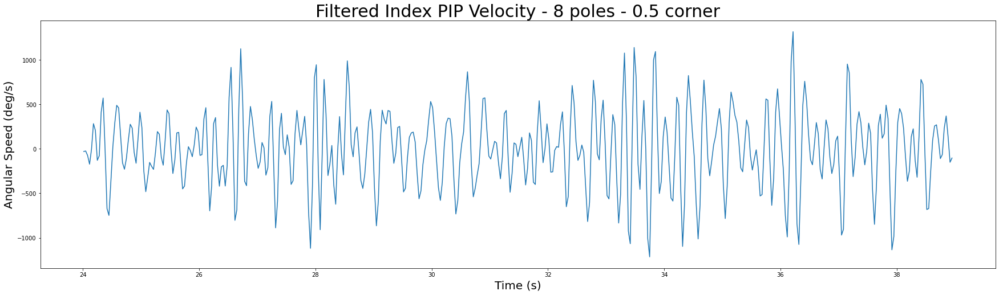

In [112]:
bottom_limit = 720
upper_limit = 1170
xaxis_seconds = np.arange(bottom_limit,upper_limit)/30

orders = [4,5,6,7,8]
corners = [0.1,0.2,0.3,0.4,0.5]

plt.figure(figsize=(30,8))
plt.plot(xaxis_seconds, pip_joints[bottom_limit:upper_limit,3])
plt.title('Original Index PIP Angle', fontsize = 30)
plt.xlabel('Time (s)', fontsize = 20)
plt.ylabel('Angle (deg)', fontsize = 20)
plt.show()

for order in orders:
    for corner in corners:
        b, a = scipy.signal.butter(order, corner)
        filtered = scipy.signal.filtfilt(b, a, pip_joints[:,3])
        
        plt.figure(figsize=(30,8))
        plt.plot(xaxis_seconds, filtered[bottom_limit:upper_limit])
        tit = 'Filtered Index PIP Angle - ' +str(order)+ ' poles - ' +str(corner)+ ' corner'
        plt.title(tit, fontsize = 30)
        plt.xlabel('Time (s)', fontsize = 20)
        plt.ylabel('Angle (deg)', fontsize = 20)
        plt.show()
        
        der = np.diff(filtered[bottom_limit:upper_limit]) / np.diff(xaxis_seconds)
        x2 = (xaxis_seconds[:-1] + xaxis_seconds[1:]) / 2
        plt.figure(figsize=(30,8))
        plt.plot(x2, der)
        tit = 'Filtered Index PIP Velocity - ' +str(order)+ ' poles - ' +str(corner)+ ' corner'
        plt.title(tit, fontsize = 30)
        plt.xlabel('Time (s)', fontsize = 20)
        plt.ylabel('Angular Speed (deg/s)', fontsize = 20)
        plt.show()
#         if ((order == 4) and (corner == 0.3)):
#             np.savetxt('/Users/aajanquail/Downloads/1108_index_pip_velocity_butterworth_4poles_03corner.txt', der, delimiter=',') 

# Cross Correlation Plots

## Cross Correlation - MCP Joints

In [238]:
pca_neural_features.flatten().shape

(18000,)

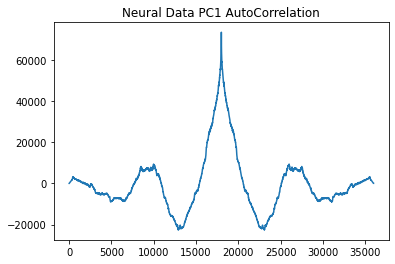

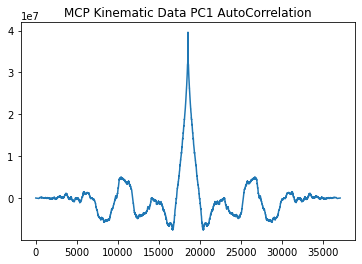

In [244]:
plt.plot(np.correlate(pca_neural_features.flatten(), pca_neural_features.flatten(),"full"))
plt.title('Neural Data PC1 AutoCorrelation')
plt.show()
plt.plot(np.correlate(pca_mcp_features.flatten(), pca_mcp_features.flatten(),"full"))
plt.title('MCP Kinematic Data PC1 AutoCorrelation')
plt.show()

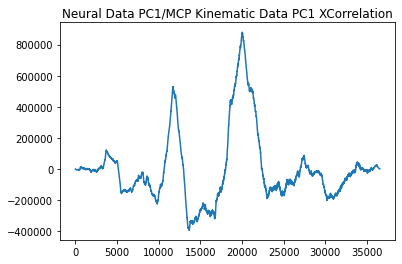

In [245]:
plt.plot(np.correlate(pca_neural_features.flatten(), pca_mcp_features.flatten(),"full"))
plt.title('Neural Data PC1/MCP Kinematic Data PC1 XCorrelation')
plt.show()

## --------------------------------------------------------------------------------

# TSNE

In [29]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components = 2)
tsne_result_angles_reshaped = tsne.fit_transform(angles_reshaped)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [30]:
tsne_result_angles_reshaped.shape

(18547, 2)

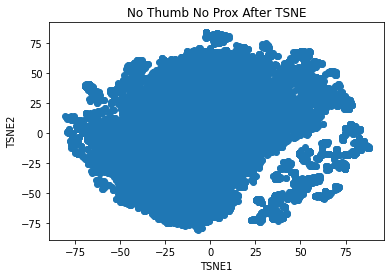

In [31]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(tsne_result_angles_reshaped[:,0], tsne_result_angles_reshaped[:,1])
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
ax.set_title('No Thumb No Prox After TSNE')
plt.show()

# UMAP

In [11]:
import umap

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(angles_reshaped)

Text(0.5, 1.0, 'UMAP')

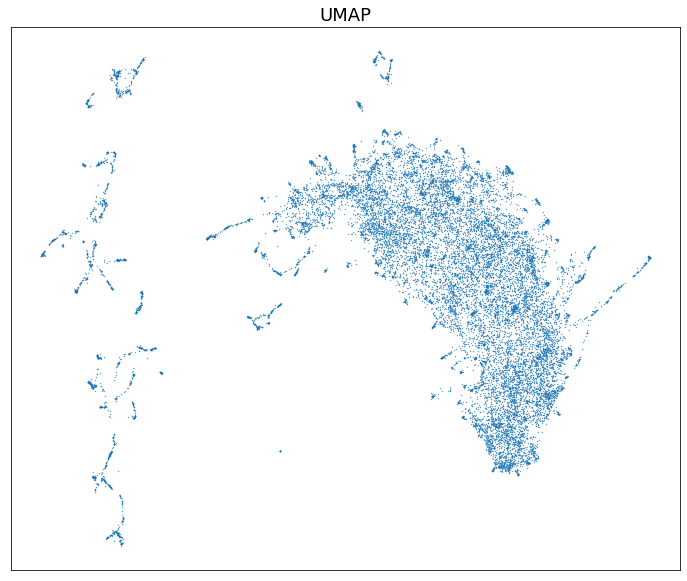

In [14]:
fig, ax = plt.subplots(figsize=(12, 10))
plt.scatter(embedding[:, 0], embedding[:, 1], cmap="Spectral", s=0.1)
plt.setp(ax, xticks=[], yticks=[])
plt.title("UMAP", fontsize=18)

# LDA